# Sentinel-1 GRD Gamma0 VV and VH Time Series in decibel units (dB)

### _Import functional dependencies and add repository source directory to system path_

In [1]:
import os
import yaml
from munch import munchify

In [2]:
# define repo name and get root working directory
repo = 'process-api'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo )]
root_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\process-api'

In [3]:
# get path to configuration files
cfg_path = os.path.join( root_path, 'cfg' )
cfg_path = os.path.join( cfg_path, 'sentinel-1' )
cfg_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\process-api\\cfg\\sentinel-1'

### _Load configuration file from repository cfg sub-directory_ 

In [4]:
# get pathname to configuration file
cfg_file = os.path.join( cfg_path, 's1-timeseries-gamma0-db.yml' )

In [5]:
# print contents of configuration file
with open( cfg_file ) as f:
    print ( f.read() )

request:
    evalscript: |
                //VERSION=3
                function setup() {
                    return {
                        input: ["VV", "VH" ],
                        output: [{ // this is now an array since there are multiple output objects
                          id: "vv",
                          bands: 1,
                          sampleType: "FLOAT32"
                        }, {
                          id: "vh",
                          bands: 1,
                          sampleType: "FLOAT32"
                        }, {
                          id: "vv_vis",
                          bands: 1,
                          sampleType: "FLOAT32"
                        }, {
                          id: "vh_vis",
                          bands: 1,
                          sampleType: "FLOAT32"
                        } ]
                    }
                }
                function evaluatePixel(samples) {
                    return {
              

In [6]:
# load cfg file using yaml parser
with open( cfg_file, 'r' ) as f:
    config = munchify( yaml.safe_load( f ) )

### _Define bounding box collated with Rome Leonardo de Vinci airport_

In [7]:
# setup aoi limits and resolution
coords = 12.214016, 41.733915, 12.307777, 41.805180
resolution = 10

In [8]:
# create instance of shclient class
from processapi import Client
client = Client( config )

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\sentinelhub\sh_utils.py:90: SHDeprecationWarning: Parameter base_url is deprecated and will soon be removed. Instead set config.sh_base_url = base_url and provide it with config parameter
  warnings.warn('Parameter base_url is deprecated and will soon be removed. Instead set '


In [9]:
# get utm bbox
bbox = client.getBoundingBox( coords )
print ( bbox, bbox.crs.value )

268302.1685479292,4623985.174566718,276348.39357999945,4631649.963426802 32633


### _Use Catalog API to locate coincident scenes acquired early February 2021_

In [10]:
# pick a few dates
from datetime import datetime
timeframe = { 'start' : datetime( 2021, 2, 1, 0, 0, 0 ), 
                'end' : datetime( 2021, 2, 7, 23, 59, 59 ) }

In [11]:
# get S2 acquisitions between start / end dates satisfying filter conditions
timestamps = client.getDatasetTimeStamps( config.request.inputs[ 0 ], bbox, timeframe )
timestamps

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\sentinelhub\sh_utils.py:90: SHDeprecationWarning: Parameter base_url is deprecated and will soon be removed. Instead set config.sh_base_url = base_url and provide it with config parameter
  warnings.warn('Parameter base_url is deprecated and will soon be removed. Instead set '


[datetime.datetime(2021, 2, 1, 5, 19, 57, tzinfo=tzutc()),
 datetime.datetime(2021, 2, 2, 5, 11, 15, tzinfo=tzutc()),
 datetime.datetime(2021, 2, 2, 17, 5, 51, tzinfo=tzutc()),
 datetime.datetime(2021, 2, 7, 5, 19, 27, tzinfo=tzutc())]

### _Download image time series from Sentinel Hub collocated with bounding box and timeframe_

In [12]:
# get time series
response = client.getTimeSeries ( bbox, timeframe, resolution )
response._df

,vv.tif,vh.tif,vv_vis.tif,vh_vis.tif,time
0,"[[-50.411892, -39.195374, -36.136192, -55.9481...","[[-66.62513, -100.0, -69.06327, -100.0, -100.0...","[[0.0, 0.14888325, 0.21531256, 0.0, 0.0, 0.0, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",2021-02-01 05:19:57+00:00
1,"[[-46.508297, -64.44694, -52.454075, -49.19445...","[[-64.880455, -64.87339, -72.17268, -100.0, -1...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.040256586, 0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",2021-02-02 05:11:15+00:00
2,"[[-55.92795, -41.92765, -52.941273, -55.922592...","[[-77.04556, -100.0, -100.0, -77.00181, -57.41...","[[0.0, 0.08955268, 0.0, 0.0, 0.0, 0.0, 0.05949...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",2021-02-02 17:05:51+00:00
3,"[[-28.995354, -25.940138, -23.544508, -24.5171...","[[-63.62552, -100.0, -100.0, -100.0, -100.0, -...","[[0.37037387, 0.43671706, 0.48873752, 0.467616...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",2021-02-07 05:19:27+00:00


### _Display visually enhanced floating point Gamma0 VV time series imagery_

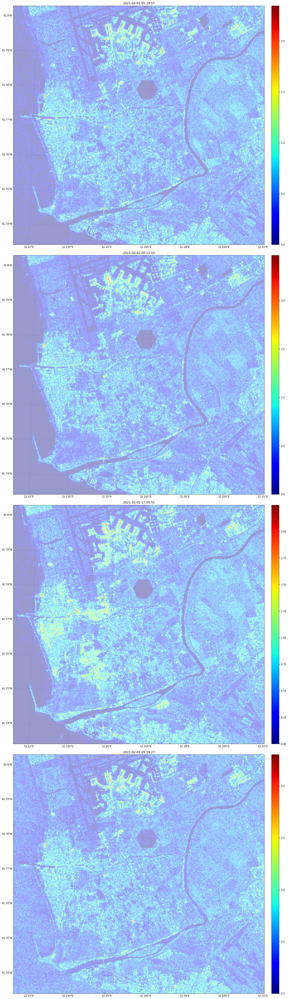

In [13]:
response.plotColorMesh( 'vv_vis.tif' )

### _Display visually enhanced floating point Gamma0 VH time series imagery_

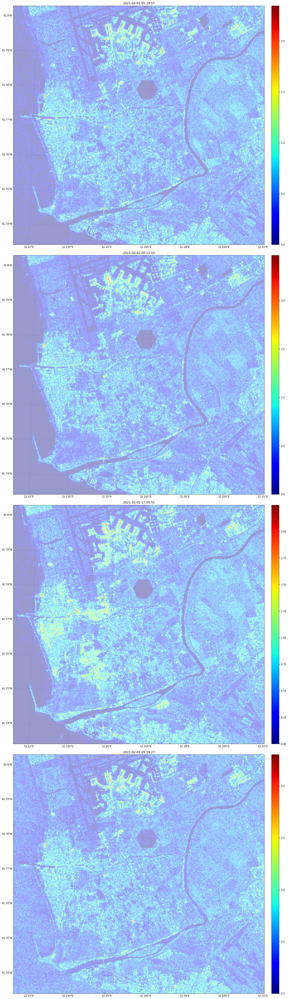

In [14]:
response.plotColorMesh( 'vv_vis.tif' )

### _Plot 2D histogram of VV vs VH Gamma0 backscatter in dB units_

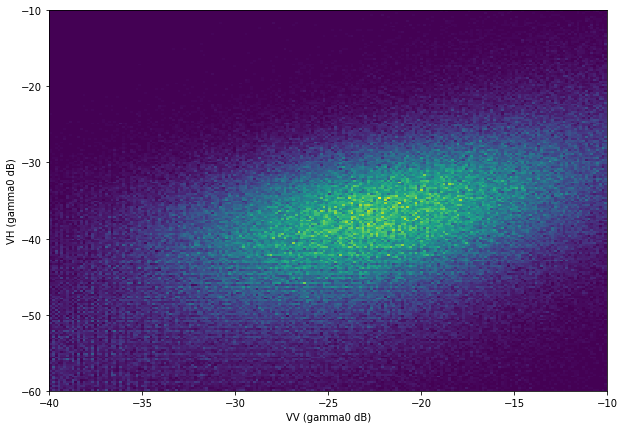

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# grab first item in time series
row = response._df.iloc[ 0 ]

# show histogram
vv = row[ 'vv.tif' ].flatten()
vh = row[ 'vh.tif' ].flatten()

# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
plt.hist2d(vv, vh, bins=200, range=np.array([(-40, -10), ( -60, -10) ] ) )

ax.set_xlabel('VV (gamma0 dB)') 
ax.set_ylabel('VH (gamma0 dB)') 

plt.show()